<h1>CS4618: Artificial Intelligence I</h1>
<h1>Neural Network Architectures</h1>
<h2>
    Derek Bridge<br>
    School of Computer Science and Information Technology<br>
    University College Cork
</h2>

<h1>Initialization</h1>
$\newcommand{\Set}[1]{\{#1\}}$ 
$\newcommand{\Tuple}[1]{\langle#1\rangle}$ 
$\newcommand{\v}[1]{\pmb{#1}}$ 
$\newcommand{\cv}[1]{\begin{bmatrix}#1\end{bmatrix}}$ 
$\newcommand{\rv}[1]{[#1]}$ 
$\DeclareMathOperator{\argmax}{arg\,max}$ 
$\DeclareMathOperator{\argmin}{arg\,min}$ 
$\DeclareMathOperator{\dist}{dist}$
$\DeclareMathOperator{\abs}{abs}$

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
import os 

from tensorflow.keras.utils import load_img, save_img, img_to_array, array_to_img
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications.xception import preprocess_input
from tensorflow.keras.applications.xception import decode_predictions
from tensorflow.keras.applications import ResNet50

from tensorflow.keras import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Rescaling
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import add

from tensorflow.keras.optimizers import RMSprop

import tensorflow as tf

<h1>Acknowledgments</h1>
<ul>
    <li>The diagrams are based on ones in: A. G&eacute;ron: 
        <i>Hands-On Machine Learning with Scikit-Learn, Keras and TensorFlow (2nd edn)</i>, O'Reilly, 2019
    </li>
    <li>The visualization code comes from: F. Chollet: <i>Deep Learning with Python (2nd edn)</i>, Manning Publications, 2021</li>
</ul>

<h1>Introduction</h1>
<ul>
    <li>In this lecture, we'll cover three main topics.</li>
    <li>First, we'll use some visiualizations to see what a neural network actually learns.</li>
    <li>Mostly up to now, we've been looking at quite simple neural network architectures: stacks of layers.
        But, the architecture could be more complicated. So the second thing we'll do is look briefly at these
        three possibilities:
        <ul>
            <li>E.g. skip connections are possible.
            </li>
            <li>E.g. you might want multiple inputs.
            </li>
            <li>E.g. you might want multiple outputs.
            </li>
        </ul>
    </li>
    <li>Up to now, the main image processing task we've looked at is image classification. The third thing we'll do 
        is look briefly at two other tasks:
        <ul>
            <li>object localisation;</li>
            <li>image segmentation</li>
        </ul>
    </li>
</ul>

<h1>Visualizing Neural Networks</h1>
<ul>
    <li>We'll use three visualizations to gan insight into what a network learns.</li>
    <li>You do not have to understand the code!</li>
    <li>We will run these visualizations on an ImageNet neural network called Xception.</li>
</ul>

In [4]:
# In some cases, we'll just use the base
xception_base = Xception(weights="imagenet", include_top=False)

2022-07-24 17:34:09.273124: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
# In other cases, we'll use the top as well
xception = Xception(weights="imagenet", include_top=True) 

In [6]:
xception.summary()

Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 149, 149, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 149, 149, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                          

 block4_sepconv1_bn (BatchNorma  (None, 37, 37, 728)  2912       ['block4_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block4_sepconv2_act (Activatio  (None, 37, 37, 728)  0          ['block4_sepconv1_bn[0][0]']     
 n)                                                                                               
                                                                                                  
 block4_sepconv2 (SeparableConv  (None, 37, 37, 728)  536536     ['block4_sepconv2_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block4_sepconv2_bn (BatchNorma  (None, 37, 37, 728)  2912       ['block4_sepconv2[0][0]']        
 lization)

 n)                                                                                               
                                                                                                  
 block7_sepconv1 (SeparableConv  (None, 19, 19, 728)  536536     ['block7_sepconv1_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block7_sepconv1_bn (BatchNorma  (None, 19, 19, 728)  2912       ['block7_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block7_sepconv2_act (Activatio  (None, 19, 19, 728)  0          ['block7_sepconv1_bn[0][0]']     
 n)                                                                                               
          

 block9_sepconv3_bn (BatchNorma  (None, 19, 19, 728)  2912       ['block9_sepconv3[0][0]']        
 lization)                                                                                        
                                                                                                  
 add_19 (Add)                   (None, 19, 19, 728)  0           ['block9_sepconv3_bn[0][0]',     
                                                                  'add_18[0][0]']                 
                                                                                                  
 block10_sepconv1_act (Activati  (None, 19, 19, 728)  0          ['add_19[0][0]']                 
 on)                                                                                              
                                                                                                  
 block10_sepconv1 (SeparableCon  (None, 19, 19, 728)  536536     ['block10_sepconv1_act[0][0]']   
 v2D)     

                                                                                                  
 block12_sepconv3_act (Activati  (None, 19, 19, 728)  0          ['block12_sepconv2_bn[0][0]']    
 on)                                                                                              
                                                                                                  
 block12_sepconv3 (SeparableCon  (None, 19, 19, 728)  536536     ['block12_sepconv3_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block12_sepconv3_bn (BatchNorm  (None, 19, 19, 728)  2912       ['block12_sepconv3[0][0]']       
 alization)                                                                                       
                                                                                                  
 add_22 (A

<ul>
    <li>We'll also make use of the cat image that we used in a previous lecture.</li>
</ul>

In [7]:
img_path = "../datasets/dataset_wikipedia_images/img1.jpg"
img = load_img(img_path, target_size=(299, 299))
img_tensor = img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor = preprocess_input(img_tensor)

<h2>Visualizing convolutional layer activations</h2>
<ul>
    <li>For a given input image, we can visualize the activations of each of the the feature maps in a given convolutional
        layer.
    </li>
    <li>This will help show the kind of feature that the feature map is detecting.</li>
</ul>

In [8]:
# Create a model that outputs the activations of the convolutional and pooling layers of the VGG16 model
layer_outputs = []
layer_names = []
for layer in xception_base.layers:
    if isinstance(layer, (Conv2D, MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)
activation_model = Model(xception_base.input, layer_outputs)

In [9]:
# Feed our example image into the model in order to compute the layer activations
activations = activation_model.predict(img_tensor)

1/1 [==============================] - 1s 687ms/step


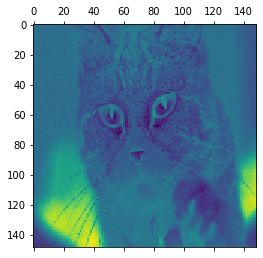

In [10]:
# Now we can plot the activation of, e.g., the third feature map in the first convolutional layer
plt.matshow(activations[0][0, :, :, 4], cmap="viridis")

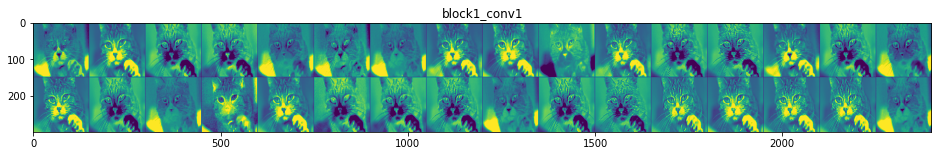

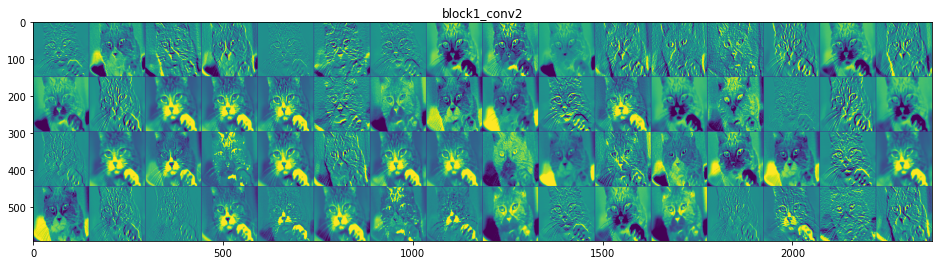

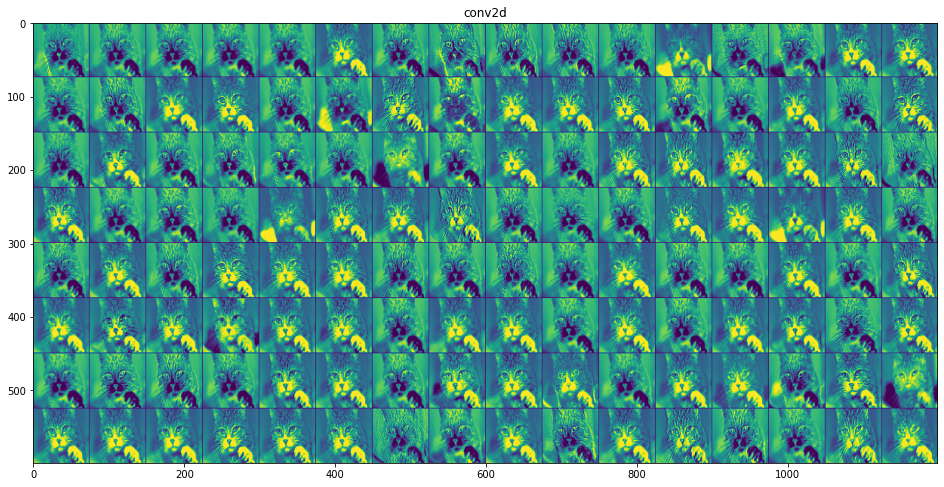

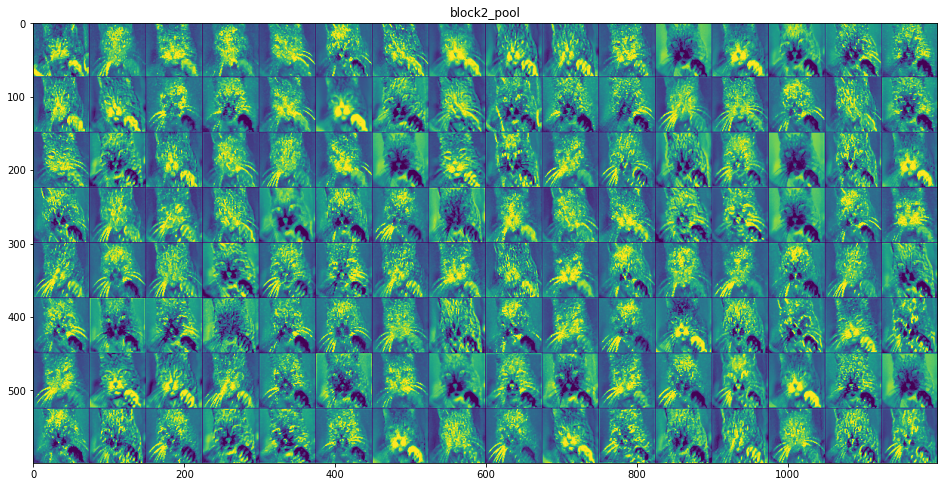

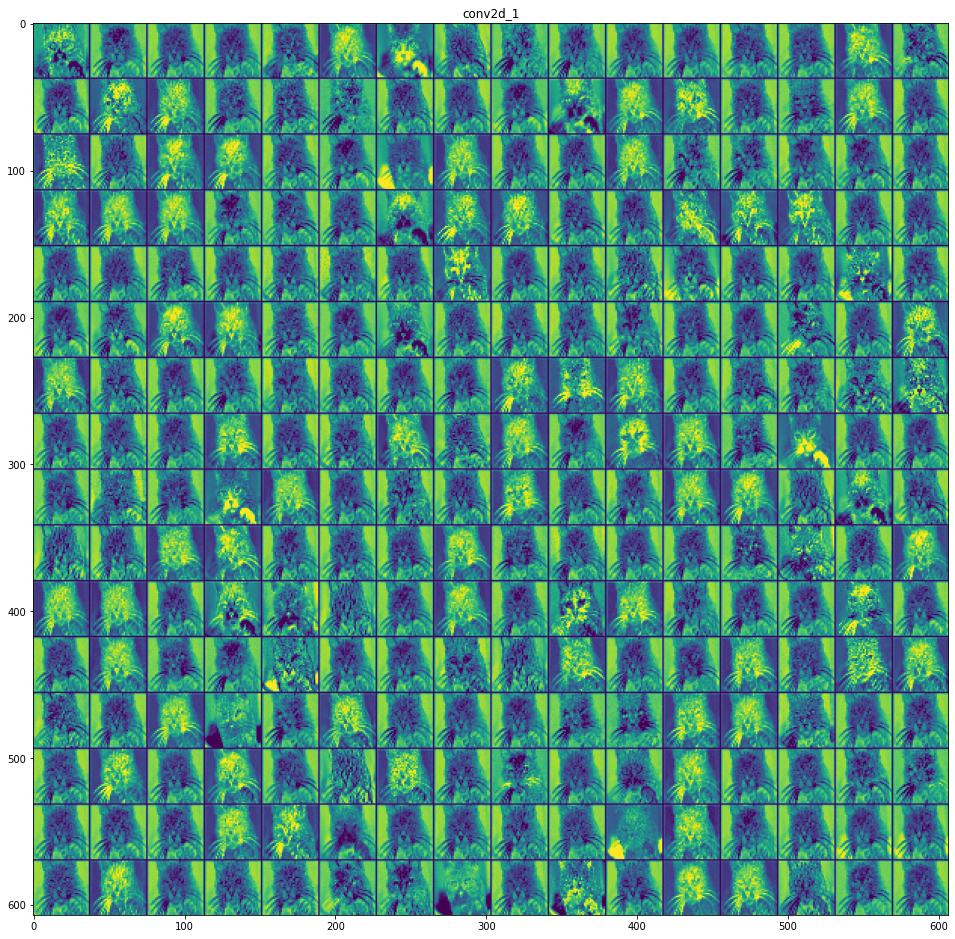

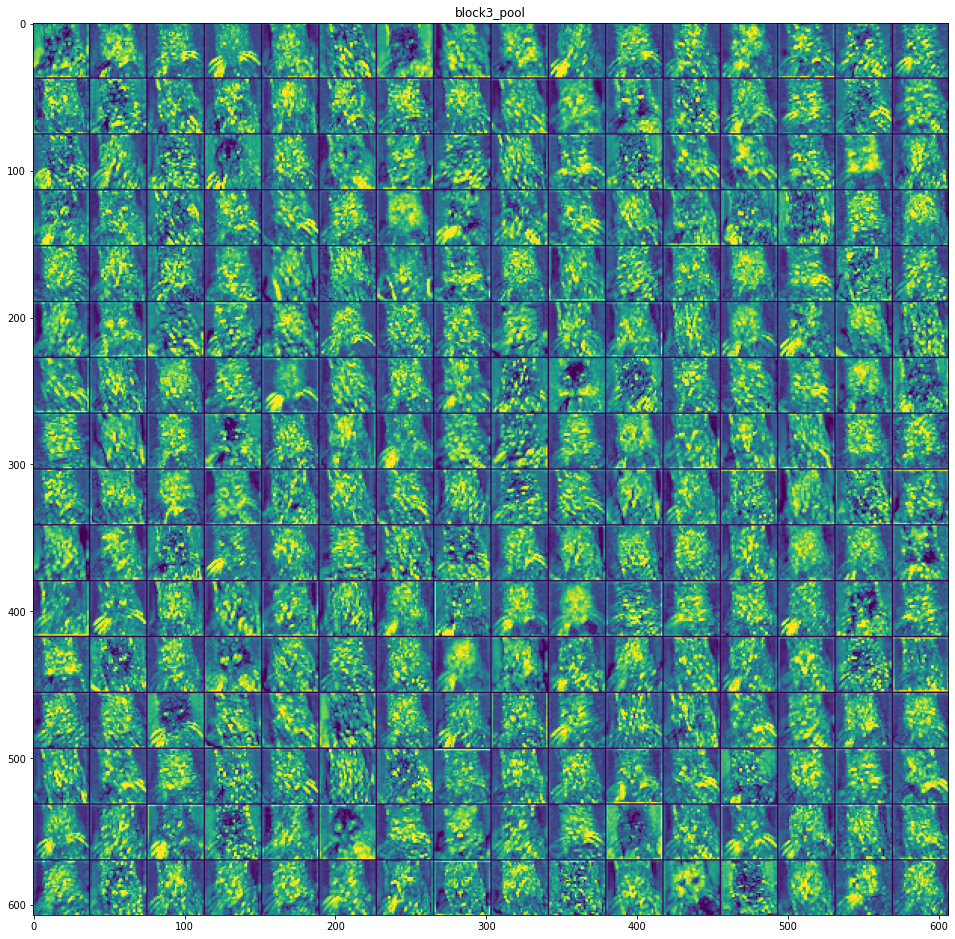

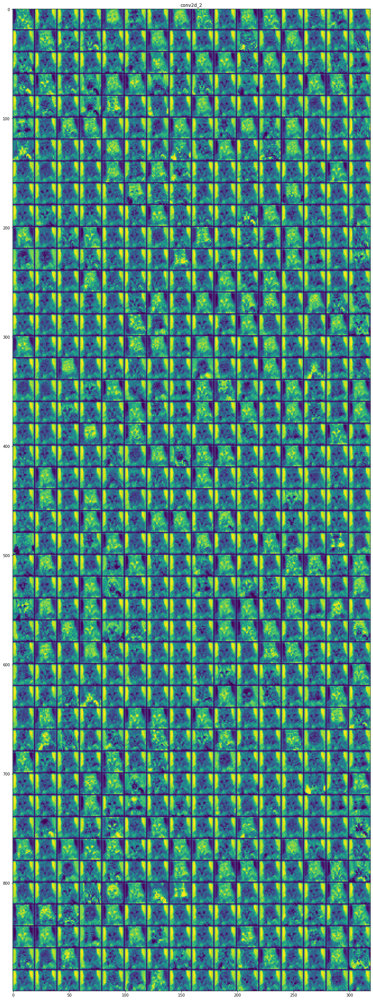

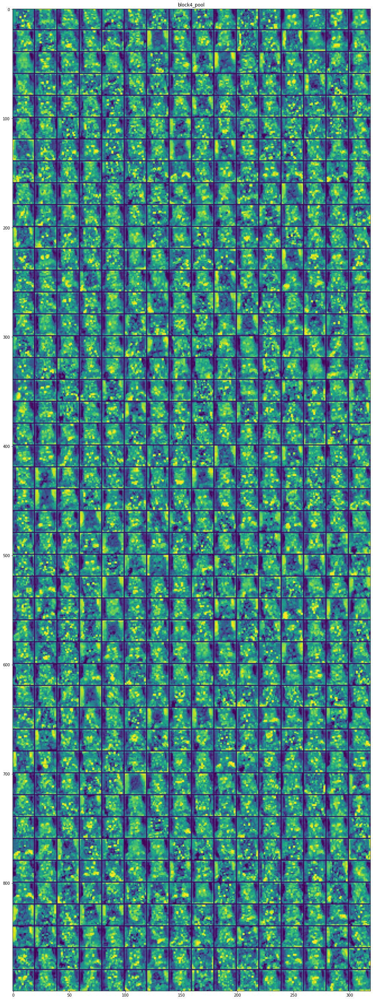

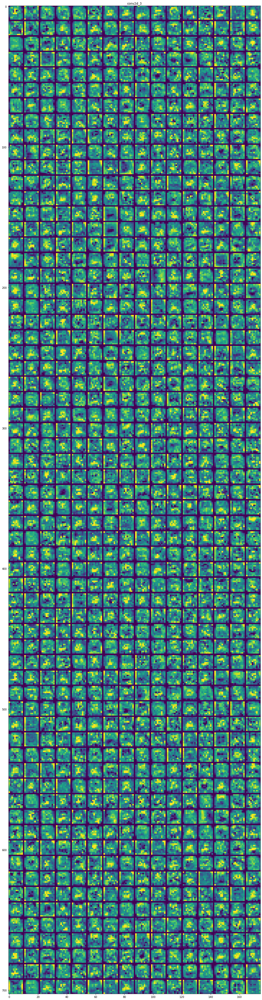

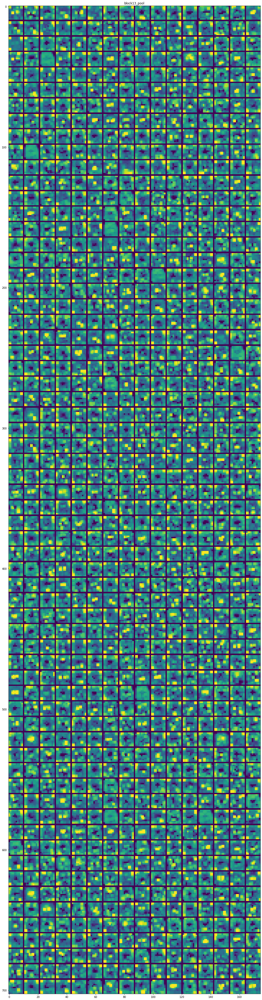

In [11]:
# Now a visualization of all activations of all feature maps in all convolutional and pooling layers

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols -1, 
                             images_per_row * (size + 1) -1))
    
    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            # Post-process the feature to make it visually palatable
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1): (row + 1) * size + row] = channel_image
    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect="auto", cmap="viridis")
    
plt.show()

<ul>
    <li>Lower layers are edge dectectors and, because these edges are common, there is a lot of activation,
        retaining a lot of the image.
    </li>
    <li>Higher in the network, features become more abstract and hence activation is less about the image
        and more about the class.
    </li>
    <li>In higher layers, there are increasing cases of no activation, meaning the feature is not present
        at all.
    </li>
</ul>

<h2>Visualizing convolutional layer inputs that maximize activations</h2>
<ul>
    <li>In this visualization, we display the kinds of inputs that feature maps respond to.</li>
    <li>This is done by gradient ascent on the input space: 
        <ul>
            <li>start from a blankish input image;</li>
            <li>finds the changes to the input that maximise the response of a feature map.</li>
        </ul>
    </li>
</ul>

In [12]:
layer_name = "block2_sepconv1" # change to e.g. "block2_sepconv1", "block4_sepconv1", "block10_sepconv1"
layer = xception_base.get_layer(name=layer_name)
feature_extractor = Model(xception_base.input, layer.output)

In [13]:
def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

In [14]:
@tf.function
def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image)
    grads = tf.math.l2_normalize(grads)
    image += learning_rate * grads
    return image

In [15]:
img_width = 200
img_height = 200

def generate_filter_pattern(filter_index):
    iterations = 30
    learning_rate = 10.
    image = tf.random.uniform(
        minval=0.4,
        maxval=0.6,
        shape=(1, img_width, img_height, 3))
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
    return image[0].numpy()

In [16]:
def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]
    return image

In [17]:
all_images = []
for filter_index in range(64):
    image = deprocess_image(
        generate_filter_pattern(filter_index)
    )
    all_images.append(image)

margin = 5
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

for i in range(n):
    for j in range(n):
        image = all_images[i * n + j]
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = image

save_img(os.path.join("images", f"filters_for_layer_{layer_name}.png"), stitched_filters)

<ul>
    <li>Go back and change the <code>layer_name</code> to see what maximizes the activation of other layers.</li>
    <li>You'll see that the feature maps in, e.g., block2_sepconv1 respond to simple edges and colours.</li>
    <li>The feature maps in block4_sepconv1 respond to simple textures made from combinations of edges and
        colours.
    </li>
    <li>The feature maps in later layers respond to natural-looking textures resembling feathers, leaves, etc.
    </li>
</ul>

<h2>Visualizing heatmaps for classification</h2>
<ul>
    <li>For a given input image and a predicted class, this will show which
        parts of the image were most useful in making the classification.
        <ul>
            <li>For every pixel, we compute a score indicating how important that pixel is
                in predicting the class.
            </li>
            <li>We display the scores as a heatmap.</li>
            <li>This can be helpful in debugging models: we
                can see whether the model is paying attention to the 'right' parts of the image.
            </li>
        </ul>
    </li>
</ul>

In [18]:
# Create a model that returns the last convolutional output
last_conv_layer_name = "block14_sepconv2_act"
classifier_layer_names = [
    "avg_pool",
    "predictions",
]
last_conv_layer = xception.get_layer(last_conv_layer_name)
last_conv_layer_model = Model(xception.inputs, last_conv_layer.output)

In [19]:
# Reapply the classifier on top of the last convolutional output
classifier_input = Input(shape=last_conv_layer.output.shape[1:])
x = classifier_input
for layer_name in classifier_layer_names:
    x = xception.get_layer(layer_name)(x)
classifier_model = Model(classifier_input, x)

In [20]:
# Retrieve the gradients of the top predicted class
with tf.GradientTape() as tape:
    last_conv_layer_output = last_conv_layer_model(img_tensor)
    tape.watch(last_conv_layer_output)
    preds = classifier_model(last_conv_layer_output)
    top_pred_index = tf.argmax(preds[0])
    top_class_channel = preds[:, top_pred_index]

grads = tape.gradient(top_class_channel, last_conv_layer_output)

In [21]:
# Gradient pooling and channel inportance weighting
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy()
last_conv_layer_output = last_conv_layer_output.numpy()[0]
for i in range(pooled_grads.shape[-1]):
    last_conv_layer_output[:, :, i] *= pooled_grads[i]
heatmap = np.mean(last_conv_layer_output, axis=-1)

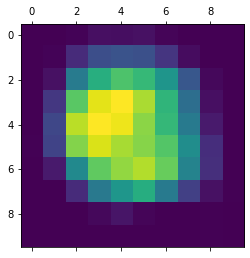

In [22]:
# Heatmap post-processing
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

In [23]:
# Superimposing the heatmap on the original picture
img = load_img(img_path)
img_tensor = img_to_array(img)

heatmap = np.uint8(255 * heatmap)

jet = plt.cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]

jet_heatmap = array_to_img(jet_heatmap)
jet_heatmap = jet_heatmap.resize((img_tensor.shape[1], img_tensor.shape[0]))
jet_heatmap = img_to_array(jet_heatmap)

superimposed_img = jet_heatmap * 0.4 + img
superimposed_img = array_to_img(superimposed_img)

save_path = os.path.join("images", "cat_cam.jpg")
superimposed_img.save(save_path)

<ul>
    <li><b>Discussion question:</b> Do you think any of these visualizations would be useful to someone who wanted to debug or audit a model?</li>
</ul>

<h1>Different Architectures</h1>
<h2>Skip connections</h2>
<ul>
    <li>We've seen that, when networks become deep, we face the vanishing gradients problem.</li>
    <li>We've discussed some solutions, e.g. ReLU activation functions in our hidden layers, not sigmoid.</li>
    <li>Another solution is to use <b>skip connections</b>, in which the input to one layer also gets fed into the next layer.
    </li>
    <li>For example, you could concatenate it to the output or add it to the output:
        <img src="images/skip_connection_nn.png" />
    </li>
    <li>In ResNet, for example, addition is used.</li>
    <li>The idea is simple in principle:</li>
</ul>

In [24]:
# Note: deliberate errors in this snippet

inputs = Input(shape=(224, 224, 3))
x = Rescaling(scale=1./255)(inputs)
x = Conv2D(filters=128, kernel_size=(3, 3), activation="relu")(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
residual = x # save the outut of the previous layer
x = Conv2D(filters=128, kernel_size=(3, 3), activation="relu", padding="same")(x)
x = MaxPooling2D(pool_size=(2, 2), padding="same")(x)
x = add([x, residual]) # combine the residual with the output of the skipped layers
x = Conv2D(filters=64, kernel_size=(3, 3), activation="relu")(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Conv2D(filters=32, kernel_size=(3, 3), activation="relu")(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Flatten()(x)
x = Dense(512, activation="relu")(x)
outputs = Dense(1, activation="sigmoid")(x)
convnet = Model(inputs, outputs)
convnet.compile(optimizer=RMSprop(learning_rate=0.0001), loss="binary_crossentropy", metrics=["accuracy"])

ValueError: Inputs have incompatible shapes. Received shapes (56, 56, 128) and (111, 111, 128)

<ul>
    <li> But, if you are usig addtion, then the output must have the same shape as the input. This is a problem if you are skipping a convolutional layer or a max-pooling layer. The details don't matter but this is what you would do:
        <ul>
            <li>Use <code>padding="same"</code> in any layer you are skipping.</li>
            <li>Use a $1 \times 1$ convolutional layer with linear activation to project the residual to the desired output shape, and adjust its strides to match any downsampling caused by a max pooling layer.
        </ul>
    </li>
</ul>

In [25]:
inputs = Input(shape=(224, 224, 3))
x = Rescaling(scale=1./255)(inputs)
x = Conv2D(filters=128, kernel_size=(3, 3), activation="relu")(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
residual = Conv2D(filters=128, kernel_size=(1,1), strides=2, activation="linear")(x) # save but downsample
x = Conv2D(filters=128, kernel_size=(3, 3), activation="relu", padding="same")(x) # padding="same"
x = MaxPooling2D(pool_size=(2, 2), padding="same")(x) # padding="same"
x = add([x, residual]) # combine - this time they have the same shapes
x = Conv2D(filters=64, kernel_size=(3, 3), activation="relu")(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Conv2D(filters=32, kernel_size=(3, 3), activation="relu")(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Flatten()(x)
x = Dense(512, activation="relu")(x)
outputs = Dense(1, activation="sigmoid")(x)
convnet = Model(inputs, outputs)
convnet.compile(optimizer=RMSprop(learning_rate=0.0001), loss="binary_crossentropy", metrics=["accuracy"])

<ul>
    <li>One of the main innovations in ResNet was the use of blocks of convolutional and max-pooling layers with a skip connection (referred to as a 'residual connection') around each block:
    </li>
</ul>

In [26]:
resnet50 = ResNet50(weights="imagenet", include_top=True, input_shape=(224, 224, 3))

In [27]:
resnet50.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_6[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 56, 56, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 28, 28, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 7, 7, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 7, 7, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 7, 7, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 7, 7, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

<h2>Multiple inputs</h2>
<ul>
    <li>We already saw an example of a layer with multipe inputs: the skip connection example &mdash; there they were being added.</li>
    <li>Multiple inputs are also helpful if your dataset comprises data of different types
        <ul>
            <li>e.g. images and text.</li>
        </ul>
    </li>
    <li>In this case, concatenation is more normal:
        <img src="images/mult_inputs_nn.png" />      
    </li>

</ul>

<h2>Multiple outputs</h2>
<ul>
    <li>Multiple outputs might be useful if, from pictures of faces, you want to classify the expression
        (similing, surprised) but you also want to classify by eyeware (wearing glasses or not).
        <img src="images/mult_outputs_nn.png" />
    </li>
    <li>There are more examples below.</li>
</ul>

<h1>Different Tasks</h1>
<h2>Object localization</h2>
<ul>
    <li>You may want to <b>locate</b> and <b>classify</b> the main object in a picture.
        <ul>
            <li>This is a classification task: what kind of object is in the image (cat, dog, &hellip;)</li>
            <li>It is also a regression task. In fact, you will want to predict four numbers that describe
                a bounding box around the object:
                <ul>
                    <li>$x$-coordinate of the centre of the bounding box;</li>
                    <li>$y$-coordinate of the centre of the bounding box;</li>
                    <li>width of the bounding box;</li>
                    <li>height of the bounding box.</li>
                </ul>
            </li>
        </ul>
    </li>
    <li>Hence, this requires a network with multiple outputs. How many outputs?</li>
</ul>

In [28]:
resnet50_base = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
n_classes = 1000

inputs = Input(shape=(224, 224, 3))
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = resnet50_base(x)
class_outputs = Dense(n_classes, activation="softmax")(x)
location_outputs = Dense(4, activation="linear")(x)
model = Model(inputs, outputs=[class_outputs, location_outputs])

model.compile(optimizer=RMSprop(learning_rate=0.001),
              loss=["sparse_categorical_cross_entropy", "mse"],
              loss_weights=[0.7, 0.3])

<ul>
    <li>In this snippet you can see the <code>Model</code> class has multiple outputs.</li>
    <li>And you can see that each output requires its own loss function.
        <ul>
            <li>By default, Keras sums the losses.</li>
            <li>If you care more about one loss than another, you supply weights.</li>
        </ul>
    </li>
    <li>Object localizaton might be used by, e.g., a self-driving car that needs to detect and monitor other cars, pedestrians, etc.</li>
</ul>

<h2>Image segmentation</h2>
<ul>
    <li>In image segmentation, the goal is to divide the image into areas and classify each area.</li>
    <li>Another way of thining about it is that it classifies each pixel.</li>
    <li>Displaying a custom background in, e.g., MS Teams, requires segmentation for pixel precision prediction
        of which parts of the image are you and what parts are not.</li>
    <li>A 'simplistic' solution uses an architecture that combines the kind of layers we've been looking at, which downsample, with layers that upssample (e.g. <code>Conv2DTranspose</code>, so that hat the ouptu layer has, not just one neuron per class, but one neuron per class per pixel. That way, you're classifying every pixel.</li>
    <li>There are lots of clever ways of doing object localizationa nd image segmentation, but we don't have time to look at them.
        (Look up, e.g., Fully Convolutional Networks and YOLO, if you are interested).
    </li>
</ul>

<h1>Deep Learning's Dirty Secret?</h1>
<ul>
    <li>Getting a labelled dataset is now even harder:
        <ul>
            <li>For object localization, every image must come with the class and bounding box
                of the main object in the image.
            </li>
            <li>For image segmentation, every pixel must comes with its class.</li>
        </ul>
    </li>
    <li>Here are some GutHub tools for doing various kinds of labelling: <a href="https://github.com/heartexlabs/awesome-data-labeling">https://github.com/heartexlabs/awesome-data-labeling</a>
    </li>
    <li>But in the lecture, we will discuss data labeling companies.</li>
</ul>

<h1>Farewell To All That</h1>
<p>
    This ends AI1! We start AI2 with lectures on getting computers to understand human languages.
</p>